In [ ]:
from __future__ import absolute_import, division, print_function
import codecs
import glob
import logging
import multiprocessing
import os
import pprint
import re
import  nltk
import  gensim.models.word2vec as w2v
import sklearn.manifold
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [4]:

nltk.download("punkt")
nltk.download("stopwords")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Parth\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Parth\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
book_filenames = sorted(glob.glob("test-inputs.txt"))

In [6]:
corpus_raw = u""
for book_filename in book_filenames:
    print("Reading '{0}'...".format(book_filename))
    with codecs.open(book_filename, "r", "utf-8") as book_file:
        corpus_raw += book_file.read()
    print("Corpus is now {0} characters long".format(len(corpus_raw)))
    print()

Reading 'test-inputs.txt'...
Corpus is now 2982071 characters long



In [7]:
tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')

In [8]:
raw_sentences = tokenizer.tokenize(corpus_raw)

In [9]:

raw_sentences[:10]

['What was the network operated by the Duct PTT Telecom\nWhen did Zhenjin die\nThe force, therefore, is related directly to the difference in potential energy between two different locations in space, and can be considered to be an artifact of the potential field in the same way that the direction and amount of a flow of water can be considered to be an artifact of the contour map of the elevation of an area\nIn 1785 James Hutton presented what paper to the Royal Society of Edinburgh\nWhat does the ctenophora use to swim\nIt is the county seat of Duval County, with which the city government consolidated in 1968\nWhere is the Asian gold miners strongest in Victoria\nHow did france differ from Britain in managing its colonies\nIn case of a shared physical medium (such as radio or 10BASE5), the packets may be delivered according to a multiple access scheme\nTo clear out this confusion about the definition of imperialism one could speak of "formal" and "informal" imperialism, the first mea

In [10]:

#convert into a list of words
#rtemove unnnecessary,, split into words, no hyphens
#list of words
#I have consider sentences as words
def sentence_to_wordlist(raw):
    words = raw.split("\n")
    return words

In [11]:
#sentence where each word is tokenized
sentences = []
for raw_sentence in raw_sentences:
    if len(raw_sentence) > 0:
        sentences.append(sentence_to_wordlist(raw_sentence))

In [12]:
#print(raw_sentences[5])
print(sentence_to_wordlist(raw_sentences[5]))

['What NASA astronaut is also a university alumni member', 'What was used to create a new electromagnetic theory to reconcile the troubles with electromagnetic theory as it used to stand', "In 1965, at the instigation of Warner Sinback, a data network based on this voice-phone network was designed to connect GE's four computer sales and service centers (Schenectady, Phoenix, Chicago, and Phoenix) to facilitate a computer time-sharing service, apparently the world's first commercial online service", 'What did the Planetary spacecraft analyze', 'What does a great amount of self-gratification undermine', 'In case of a shared physical medium (such as radio or 10BASE5), the packets may be delivered according to a multiple access scheme', 'Once a pathogen has been engulfed by a phagocyte, it becomes trapped in an intracellular vesicle called a phagosome, which subsequently fuses with another vesicle called a lysosome to form a phagolysosome', 'Similarly, algorithms can solve the NP-complete 

In [13]:
token_count = sum([len(sentence) for sentence in sentences])
print("The book corpus contains {0:,} tokens".format(token_count))

The book corpus contains 24,312 tokens


In [14]:
num_features = 30
# Minimum word count threshold.
min_word_count = 1

# Number of threads to run in parallel.
#more workers, faster we train
num_workers = multiprocessing.cpu_count()

# Context window length.
context_size = 5

# Downsample setting for frequent words.
#0 - 1e-5 is good for this
downsampling = 1e-3

# Seed for the RNG, to make the results reproducible.
#random number generator
#deterministic, good for debugging
seed = 1

In [15]:
wrd2vec = w2v.Word2Vec(
    sg=1,
    seed=seed,
    workers=num_workers,
    size=num_features,
    min_count=min_word_count,
    window=context_size,
    sample=downsampling
)

2019-02-12 00:52:28,373 : WARNING : consider setting layer size to a multiple of 4 for greater performance


In [16]:
wrd2vec.build_vocab(sentences)

2019-02-12 00:52:29,678 : INFO : collecting all words and their counts
2019-02-12 00:52:29,681 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2019-02-12 00:52:29,702 : INFO : collected 16692 word types from a corpus of 24312 raw words and 333 sentences
2019-02-12 00:52:29,705 : INFO : Loading a fresh vocabulary
2019-02-12 00:52:30,027 : INFO : effective_min_count=1 retains 16692 unique words (100% of original 16692, drops 0)
2019-02-12 00:52:30,027 : INFO : effective_min_count=1 leaves 24312 word corpus (100% of original 24312, drops 0)
2019-02-12 00:52:30,130 : INFO : deleting the raw counts dictionary of 16692 items
2019-02-12 00:52:30,130 : INFO : sample=0.001 downsamples 0 most-common words
2019-02-12 00:52:30,144 : INFO : downsampling leaves estimated 24312 word corpus (100.0% of prior 24312)
2019-02-12 00:52:30,225 : INFO : estimated required memory for 16692 words and 30 dimensions: 12352080 bytes
2019-02-12 00:52:30,230 : INFO : resetting layer weigh

In [17]:
print("Word2Vec vocabulary length:", len(wrd2vec.wv.vocab))

Word2Vec vocabulary length: 16692


In [18]:
wrd2vec.train(sentences, epochs=wrd2vec.epochs, total_examples=wrd2vec.corpus_count)

2019-02-12 00:52:56,720 : INFO : training model with 4 workers on 16692 vocabulary and 30 features, using sg=1 hs=0 sample=0.001 negative=5 window=5
2019-02-12 00:52:56,744 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-02-12 00:52:56,945 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-02-12 00:52:57,031 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-02-12 00:52:57,042 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-02-12 00:52:57,044 : INFO : EPOCH - 1 : training on 24312 raw words (24312 effective words) took 0.3s, 78817 effective words/s
2019-02-12 00:52:57,069 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-02-12 00:52:57,188 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-02-12 00:52:57,258 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-02-12 00:52:57,282 : INFO : worker thread finished; awaiting finish of 0 more

(121560, 121560)

In [19]:

token_count = sum([len(sentence) for sentence in sentences])
wrd2vec.train(sentences, total_examples = token_count, epochs = 10)

2019-02-12 00:53:16,844 : WARNING : Effective 'alpha' higher than previous training cycles
2019-02-12 00:53:16,848 : INFO : training model with 4 workers on 16692 vocabulary and 30 features, using sg=1 hs=0 sample=0.001 negative=5 window=5
2019-02-12 00:53:16,864 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-02-12 00:53:17,021 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-02-12 00:53:17,106 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-02-12 00:53:17,118 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-02-12 00:53:17,120 : INFO : EPOCH - 1 : training on 24312 raw words (24312 effective words) took 0.3s, 94430 effective words/s
2019-02-12 00:53:17,123 : WARNING : EPOCH - 1 : supplied example count (333) did not equal expected count (24312)
2019-02-12 00:53:17,147 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-02-12 00:53:17,253 : INFO : worker thread finished; aw

(243120, 243120)

In [20]:
if not os.path.exists("trained"):
    os.makedirs("trained")

In [21]:
wrd2vec.save(os.path.join("trained", "wrd2vec.w2v"))

2019-02-12 00:53:41,709 : INFO : saving Word2Vec object under trained\wrd2vec.w2v, separately None
2019-02-12 00:53:41,712 : INFO : not storing attribute vectors_norm
2019-02-12 00:53:41,716 : INFO : not storing attribute cum_table
2019-02-12 00:53:42,029 : INFO : saved trained\wrd2vec.w2v


In [22]:
wrd2vec = w2v.Word2Vec.load(os.path.join("trained", "wrd2vec.w2v"))

2019-02-12 00:53:56,816 : INFO : loading Word2Vec object from trained\wrd2vec.w2v
2019-02-12 00:53:56,936 : INFO : loading wv recursively from trained\wrd2vec.w2v.wv.* with mmap=None
2019-02-12 00:53:56,936 : INFO : setting ignored attribute vectors_norm to None
2019-02-12 00:53:56,941 : INFO : loading vocabulary recursively from trained\wrd2vec.w2v.vocabulary.* with mmap=None
2019-02-12 00:53:56,942 : INFO : loading trainables recursively from trained\wrd2vec.w2v.trainables.* with mmap=None
2019-02-12 00:53:56,947 : INFO : setting ignored attribute cum_table to None
2019-02-12 00:53:56,950 : INFO : loaded trained\wrd2vec.w2v


In [23]:
tsne = sklearn.manifold.TSNE(n_components=2, random_state=0)

In [24]:
all_word_vectors_matrix  = wrd2vec.syn0_lockf

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `syn0_lockf` (Attribute will be removed in 4.0.0, use self.trainables.vectors_lockf instead).
  if __name__ == '__main__':


In [25]:
print(all_word_vectors_matrix)

[1. 1. 1. ... 1. 1. 1.]


In [26]:
all_word_vectors_matrix.shape

(16692,)

In [27]:
np.isfinite(all_word_vectors_matrix).all()


True

In [28]:
np.isnan(all_word_vectors_matrix).any()


False

In [29]:
np.isinf(all_word_vectors_matrix).all()

False

In [30]:
# This might take time upto 10 minutes , atleast on laptop like mine with 12 gigs RAM
all_word_vectors_matrix = all_word_vectors_matrix.reshape(-1,1)
all_word_vectors_matrix_2d  = tsne.fit_transform(all_word_vectors_matrix)

In [31]:
points = pd.DataFrame(
    [
        (word, coords[0], coords[1])
        for word, coords in [
            (word, all_word_vectors_matrix_2d[wrd2vec.wv.vocab[word].index])
            for word in wrd2vec.wv.vocab
        ]
    ],
    columns=["words", "x", "y"]
)

In [1]:
print(points[:10])

NameError: name 'points' is not defined

In [33]:
sns.set_context("poster")

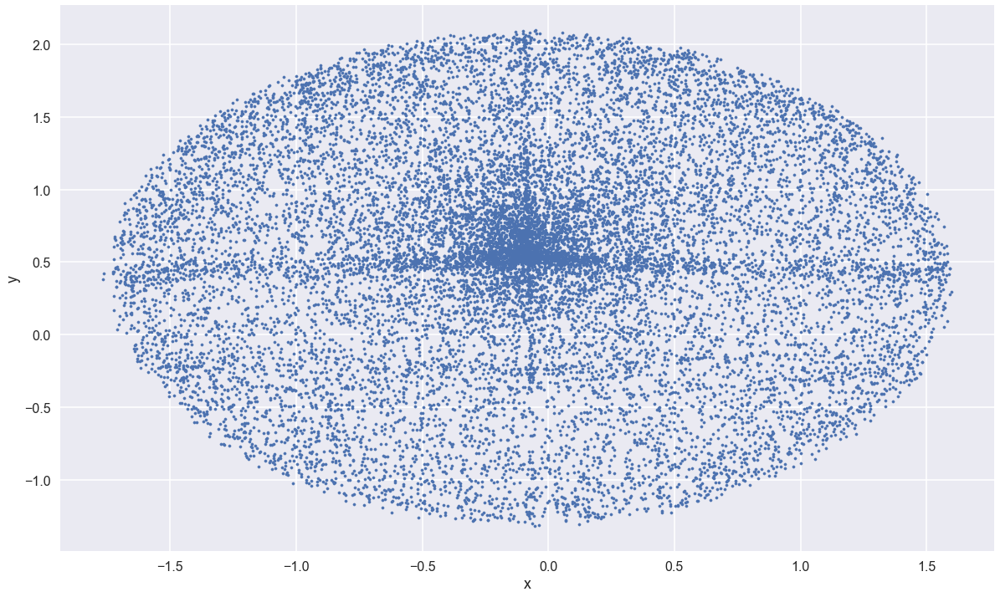

In [34]:
points.plot.scatter("x", "y", s=10, figsize=(20, 12))

In [35]:
def plot_region(x_bounds, y_bounds):
    slice = points[
        (x_bounds[0] <= points.x) &
        (points.x <= x_bounds[1]) & 
        (y_bounds[0] <= points.y) &
        (points.y <= y_bounds[1])
    ]
    
    ax = slice.plot.scatter("x", "y", s=10, figsize=(10, 8))
    for i, point in slice.iterrows():
        ax.text(point.x + 0.005, point.y + 0.005, point.word, fontsize=11)

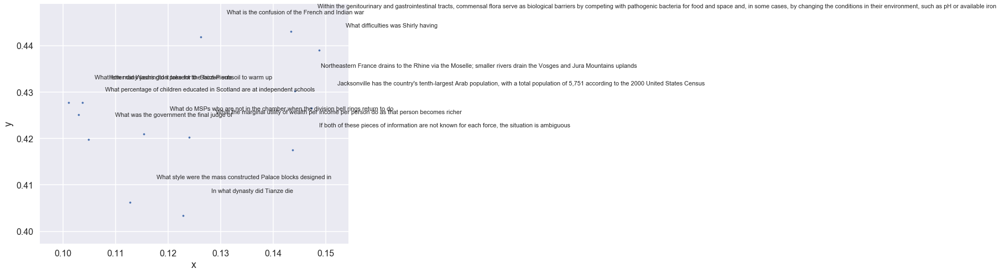

In [36]:
plot_region(x_bounds=(0.1, 0.15), y_bounds=(0.4, 0.45))

In [39]:
wrd2vec.most_similar("These words were very meaningful for the Polish citizens who understood them as the incentive for the democratic changes")

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  if __name__ == '__main__':
2019-02-12 01:03:55,392 : INFO : precomputing L2-norms of word weight vectors
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Following the defeat of Napoleonic France in 1815, Britain enjoyed a century of almost unchallenged dominance and expanded its imperial holdings around the globe',
  0.7050089240074158),
 ('In southern California there are also twelve cities with more than 200,000 residents and 34 cities over 100,000 in population',
  0.671999990940094),
 ('"Great Mongol State"), resulting in Dai Ön Yeke Mongghul Ulus (Mongolian script: ), meaning "Great Yuan Great Mongol State',
  0.6675364971160889),
 ("The University's undergraduate program has been continuously among the top two in the U.S. News & World Report",
  0.6548095345497131),
 ('However, the harmonic series 1 + 1/2 + 1/3 + 1/4 + ... diverges (i.e., exceeds any given number), so there must be infinitely many primes',
  0.6469066143035889),
 ('What is the kilogram-force sometimes reffered to as', 0.6420969367027283),
 ("Due to its central location between the Commonwealth's capitals of Kraków and Vilnius, Warsaw became the capital of the 

In [40]:
wrd2vec.most_similar("What are they?")

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  if __name__ == '__main__':
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Who produced enough oxygen to study in 1819', 0.6423701643943787),
 ('What channels were removed from the network in March of 2007',
  0.5686185956001282),
 ('Why does government exist according to anarchists', 0.5641093850135803),
 ('When did Millerton residents move out of Fresno', 0.5458199977874756),
 (' Where was the non-Muslim Brotherhood founded', 0.536729097366333),
 ('Which year did the price of oil drop to $10 per barrel',
  0.5267837047576904),
 ('In theory, this is because TFEU article 288 says Directives are addressed to the member states and usually "leave to the national authorities the choice of form and methods" to implement',
  0.5246328115463257),
 ('What is a magazine for design companies', 0.5202622413635254),
 ('Why was it developed in 1983', 0.51300448179245),
 ('When was the Russian Policy "Indigenization" defunded', 0.5082443952560425)]

In [41]:
wrd2vec.most_similar("What political party is strongest in Melbourne's working class suburbs")

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  if __name__ == '__main__':
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Deeper in the Earth, rocks behave plastically, and fold instead of faulting',
  0.7161769270896912),
 ('Another example was the insignificance of the Ministry of War compared with native Chinese dynasties, as the real military authority in Yuan times resided in the Privy Council',
  0.6919445991516113),
 ('What machine does not define BPP, ZPP, and RP', 0.6845596432685852),
 ('Much of the work of the Scottish Parliament is done in committee',
  0.680514395236969),
 ('The official record high temperature for Fresno is 115 °F (46.1 °C), set on July 8, 1905, while the official record low is 17 °F (−8 °C), set on January 6, 1913',
  0.6597869992256165),
 ('The first Huguenots to leave France sought freedom from persecution in Switzerland and the Netherlands',
  0.6461461782455444),
 ('The other three are located in a residential neighborhood half a mile northwest of the Yard at the Quadrangle (commonly referred to as the Quad), which formerly housed Radcliffe College students until Radc

In [42]:
L = wrd2vec.similar_by_word("What was the network operated by the Duct PTT Telecom",topn =24000,restrict_vocab = 25000)

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).
  if __name__ == '__main__':
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [43]:
print(L)

[('What was the triad?', 0.6651365756988525), ('When was Tugh Temur born', 0.6064592003822327), ("What did John Paul II's visits in 1979 and 1983 encourage", 0.5952153205871582), ('Which country besides the Cuba did the United states try to annex in 1898', 0.5862443447113037), ('What resource is the economy of southern California depedent on', 0.5636900663375854), ('How many factors of health and social problems did Wilkinson and PIckett identify', 0.5615420341491699), ('What type of defense is sometimes used in court by protestors', 0.5610215067863464), ('What president eliminated the Christian position in the curriculum', 0.5583342909812927), ('What rank for most populous city in the European Union does Warsaw hold', 0.5330166816711426), ('What are undergraduates required to take to satisfy the Chicago Core curriculum', 0.5219801664352417), ('What complexity class is commonly characterized by unknown algorithms to enhance solvability', 0.5168007612228394), ('How many naval bases are 

In [44]:
len(L)

16691

In [48]:
t = points['word']

In [59]:
print(t)

0        What was the network operated by the Duct PTT ...
1                                     When did Zhenjin die
2        The force, therefore, is related directly to t...
3        In 1785 James Hutton presented what paper to t...
4                     What does the ctenophora use to swim
5        It is the county seat of Duval County, with wh...
6        Where is the Asian gold miners strongest in Vi...
7        How did france differ from Britain in managing...
8        In case of a shared physical medium (such as r...
9        To clear out this confusion about the definiti...
10       In contrast, during wake periods differentiate...
11       In turn, imposing restrictions on the availabl...
12       The university experienced its share of studen...
13       These include various types of integer program...
14       Paleoclimatologists measure the ratio of oxyge...
15       What months out of the year is Woodward Park open
16       Of the nine members of the European Economic C.

In [49]:
wrd2vec.most_similar(t[20])

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  if __name__ == '__main__':
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Starting in the late 1950s, American computer scientist Paul Baran developed the concept Distributed Adaptive Message Block Switching with the goal to provide a fault-tolerant, efficient routing method for telecommunication messages as part of a research program at the RAND Corporation, funded by the US Department of Defense',
  0.856386661529541),
 ('In 1562, naval officer Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost of Charlesfort on Parris Island, South Carolina',
  0.8443225622177124),
 ('A chapter typically has two "coordinating lead authors", ten to fifteen "lead authors", and a somewhat larger number of "contributing authors',
  0.8421423435211182),
 ('By this definition, civil disobedience could be traced back to the Book of Exodus, where Shiphrah and Puah refused a direct order of Pharaoh but misrepresented how they did it',
  0.8344055414199829),
 ('Packets are normally forwarded by intermediate network

In [62]:
file = open('test-inputs.txt', 'r',encoding="utf8")
line = []
for line in file: 
    print(line)

What was the network operated by the Duct PTT Telecom

When did Zhenjin die

The force, therefore, is related directly to the difference in potential energy between two different locations in space, and can be considered to be an artifact of the potential field in the same way that the direction and amount of a flow of water can be considered to be an artifact of the contour map of the elevation of an area

In 1785 James Hutton presented what paper to the Royal Society of Edinburgh

What does the ctenophora use to swim

It is the county seat of Duval County, with which the city government consolidated in 1968

Where is the Asian gold miners strongest in Victoria

How did france differ from Britain in managing its colonies

In case of a shared physical medium (such as radio or 10BASE5), the packets may be delivered according to a multiple access scheme

To clear out this confusion about the definition of imperialism one could speak of "formal" and "informal" imperialism, the first meani

In [63]:
line = open("test-inputs.txt", "r",encoding="utf8").readlines()

In [64]:
print(line[2])

The force, therefore, is related directly to the difference in potential energy between two different locations in space, and can be considered to be an artifact of the potential field in the same way that the direction and amount of a flow of water can be considered to be an artifact of the contour map of the elevation of an area



In [65]:
line[1]

'When did Zhenjin die\n'

In [69]:
print(L)

[('What is the Japanese name for the Yuan dynasty', 0.6024616360664368), ('What organization did Iqbal join in London', 0.5430793166160583), ('When would a person be considered to be excising a constitutional impasse', 0.5346031188964844), ("What don't capitalist firms substitute equipment for in a Marxian analysis", 0.5264140963554382), ('What did Kent-Brown do to interrupt a speech by Harvard', 0.5248981714248657), ("How much percentage of Victoria's land is taken up by farms", 0.5038545727729797), ('What type of climate stop reinforced from spreading across the continent', 0.5028721690177917), (' What were the Yuan armies too strong to stop', 0.49913671612739563), ('What is the lowest recorded temperature in Victoria', 0.49887385964393616), ('What does the name The Rhine come from?', 0.4911160171031952), ('Rock units become thicker and shorten when placed under this type of compression.', 0.48825713992118835), (' What aspects of life does Islamism not seek to integrate itself into',

In [51]:
len(L)

16691

In [82]:
J = wrd2vec.similar_by_word("These include various types of integer programming problems in operations research, many problems in logistics, protein structure prediction in biology, and the ability to find formal proofs of pure mathematics theorems",topn =24000,restrict_vocab = 25000)

C:\Users\Parth\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).
  if __name__ == '__main__':
C:\Users\Parth\Anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [83]:
print(J)

[('What novel was written by LeGrande', 0.7331384420394897), ('In 1976, BankAmericard was renamed and spun off into a separate company known today as Visa Inc', 0.6443658471107483), ('Nestorianism and Roman Catholicism also enjoyed a period of toleration', 0.6423162221908569), ('The reasons for the las two counties to be added are based on what', 0.6364562511444092), ('The Second World War caused what to be shelved', 0.6156406402587891), ('What is it estimated that about a third of all variation in homicide rates can be accounted for by', 0.6144025921821594), ('What do the tentacles on plankton do to help them find prey', 0.6074510812759399), ("The university's sociology department was the first independent sociology department in the United States and gave birth to the Chicago school of sociology", 0.6016854643821716), ('How is the judicial branch of the EU an important factor in the development of EU law', 0.5937390327453613), ('What is the original meaning of the word Norman', 0.591

In [84]:
len(J)

16691

In [86]:
line[0]

'What was the network operated by the Duct PTT Telecom\n'

In [81]:
txtfile = open('prediction.txt','a')
for i in range(0,100):
    print(line[i])
    for z in range(0,16691):
        if line[i].replace('\n','') in L[z] and L[z][1] > 0.2:
            print('Question')
            txtfile.write("1 \n")
            break
        if line[i].replace('\n','') in J[z] and J[z][1] > 0.1:
            print('Question')
            txtfile.write("1 \n")
            break
    else:
        print('Not a Question')
        txtfile.write("0 \n")

txtfile.close()
print('--------------------------------------------------------------------------------------------------------------')
print('--------------------------------------------------------------------------------------------------------------')
print("Entire process completed successfully ! Open your txt file and look at the results.")        

What was the network operated by the Duct PTT Telecom

0
When did Zhenjin die

1
The force, therefore, is related directly to the difference in potential energy between two different locations in space, and can be considered to be an artifact of the potential field in the same way that the direction and amount of a flow of water can be considered to be an artifact of the contour map of the elevation of an area

1
In 1785 James Hutton presented what paper to the Royal Society of Edinburgh

0
What does the ctenophora use to swim

1
It is the county seat of Duval County, with which the city government consolidated in 1968

0
Where is the Asian gold miners strongest in Victoria

0
How did france differ from Britain in managing its colonies

1
In case of a shared physical medium (such as radio or 10BASE5), the packets may be delivered according to a multiple access scheme

0
To clear out this confusion about the definition of imperialism one could speak of "formal" and "informal" imperialis